# Films Data Set Analysis and Visualization

In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns

import cufflinks as cf
import chart_studio.plotly as py
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

from collections import Counter

cf.go_offline()

from wordcloud import WordCloud, ImageColorGenerator

%matplotlib inline

## Taking a look at our Data Set

In [2]:
df = pd.read_csv("MoviesOnStreamingPlatforms_updated.csv")
df_countries = pd.read_csv("FilmsByCountry.csv")

# Kaggle

# df = pd.read_csv("../input/movies-on-netflix-prime-video-hulu-and-disney/MoviesOnStreamingPlatforms_updated.csv")
# df_countries = pd.read_csv("../input/filmsbycountry/FilmsByCountry.csv")

In [3]:
df.head()

,Unnamed: 0,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Netflix,Hulu,Prime Video,Disney+,Type,Directors,Genres,Country,Language,Runtime
0,0,1,Inception,2010,13+,8.8,87%,1,0,0,0,0,Christopher Nolan,"Action,Adventure,Sci-Fi,Thriller","United States,United Kingdom","English,Japanese,French",148.0
1,1,2,The Matrix,1999,18+,8.7,87%,1,0,0,0,0,"Lana Wachowski,Lilly Wachowski","Action,Sci-Fi",United States,English,136.0
2,2,3,Avengers: Infinity War,2018,13+,8.5,84%,1,0,0,0,0,"Anthony Russo,Joe Russo","Action,Adventure,Sci-Fi",United States,English,149.0
3,3,4,Back to the Future,1985,7+,8.5,96%,1,0,0,0,0,Robert Zemeckis,"Adventure,Comedy,Sci-Fi",United States,English,116.0
4,4,5,"The Good, the Bad and the Ugly",1966,18+,8.8,97%,1,0,1,0,0,Sergio Leone,Western,"Italy,Spain,West Germany",Italian,161.0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16744 entries, 0 to 16743
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Unnamed: 0       16744 non-null  int64  
 1   ID               16744 non-null  int64  
 2   Title            16744 non-null  object 
 3   Year             16744 non-null  int64  
 4   Age              7354 non-null   object 
 5   IMDb             16173 non-null  float64
 6   Rotten Tomatoes  5158 non-null   object 
 7   Netflix          16744 non-null  int64  
 8   Hulu             16744 non-null  int64  
 9   Prime Video      16744 non-null  int64  
 10  Disney+          16744 non-null  int64  
 11  Type             16744 non-null  int64  
 12  Directors        16018 non-null  object 
 13  Genres           16469 non-null  object 
 14  Country          16309 non-null  object 
 15  Language         16145 non-null  object 
 16  Runtime          16152 non-null  float64
dtypes: float64(2

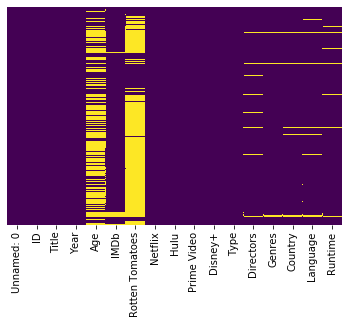

In [5]:
# Let´s see what data we are missing

sns.heatmap(df.isna(),yticklabels=False,cbar=False,cmap="viridis")

We seem to be missing a lot of information on the films age appropriateness as well as the Rotten Tomatoes ratings. We´re also missing some information about the Directors, Genres, Country, Language and Runtime.

In [6]:
netflix_movies = len(df[df["Netflix"]==1].index)
hulu_movies = len(df[df["Hulu"]==1].index)
prime_movies = len(df[df["Prime Video"]==1].index)
disney_movies = len(df[df["Disney+"]==1].index)

print("Number of movies on each platform:")
print("\n")
print(f"Netflix:\t {netflix_movies}")
print(f"Hulu:\t\t {hulu_movies}")
print(f"Prime Video:\t {prime_movies}")
print(f"Disney+:\t {disney_movies}")

Number of movies on each platform:


Netflix:	 3560
Hulu:		 903
Prime Video:	 12354
Disney+:	 564


## Platforms

In [7]:
values = [netflix_movies,hulu_movies,prime_movies,disney_movies]
labels = ["Netflix","Hulu","Prime Video","Disney+"]
explode = (0.1, 0, 0, 0)

fig = go.Figure(data=[go.Pie(labels=labels, values=values, hole=.4)])
fig.show()

I certainly did not expect this! With all the talk there is about Netflix and you can find three times more movies on Prime Video. I guess Netflix has a better marketing strategy.

## Locations

Where are the films made?

For this we I´m going to use the df_countries dataframe which I created on a separate notebook. Te dataframe contains the number of movies filmed on each country as well as the Alpha 3 (ISO 3166) country codes (which was a real pain to add). We´ll need these codes in order to plot a world-wide cloropeth map.

In [8]:
df_countries.head()

,Unnamed: 0,Country,Number of Films,CODE
0,0,Afghanistan,4,AFG
1,1,Albania,5,ALB
2,2,Algeria,4,DZA
3,3,Angola,1,AGO
4,4,Argentina,106,ARG


In [9]:
data = df_countries

n = 30

fig = px.bar(df_countries.sort_values(by="Number of Films",ascending=False).reset_index().iloc[:n],
             x='Country', y='Number of Films',
             color='Number of Films',
             title=f"Top {n} countries with most filmed films",
             height=400)
fig.show()

This doesn´t come as a surprise, with most of the movies made in the USA, with Bollywood standing in third position after the UK. 

In [10]:
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

In [11]:
fig = px.choropleth(df_countries, locations="CODE",
                    color="Number of Films",
                    hover_name="Country",
                    color_continuous_scale=px.colors.sequential.Plasma,
                    title="Number of films filmed per country",
                    height=500,
                    width=800)
fig.show() 

## Ratings

Let's find out as much information as we can related with the ratings. For this we can use two columns. IMDb or Rotten Tomatoes. I will use IMDb mainly for three reasons: 1. As I showed earlier Rotten Tomatoes is missing a lot of information, 2. Rotten Tomatoes ratings come in string format, which we would have to convert into numeric in order to work with it and 3. Personally I use IMDb on my daoly basis to check out movie ratings and reviews, so I´m quite familiarized with it.

So let´s drop that column before doing anything else.

In [12]:
df.drop("Rotten Tomatoes",axis=1,inplace=True)

Firstly, let´s plot a very simple graph to see which are the best rated movies. We have over 16700 movies, so we´ll select a top! 

In [13]:
n = 30

top_ratings = df.sort_values(by="IMDb",ascending=False).reset_index().iloc[:n]

fig = px.bar(top_ratings,
             x = "Title", y='IMDb',
             color='IMDb',
             hover_data=["Directors","IMDb"],
             title=f"Top {n} best rated movies",
             height=1000,
             color_continuous_scale=px.colors.sequential.Viridis)
fig.show()

We often hear that nowadays they don´t make films as they used to... as if today´s films were not as good as the ones filmed years ago. Let´s see if that's entirely true...

In [14]:
df_year = df.groupby("Year").mean()
df_year.drop(["Unnamed: 0","ID",'Netflix', 'Hulu', 'Prime Video', 'Disney+', 'Type'],inplace=True,axis=1)
df_year["Movie Count"] = df.groupby("Year").count()["ID"]
df_year.head()

,IMDb,Runtime,Movie Count
Year,,,
1902,8.20,13.0,1
1912,5.70,60.0,1
1913,5.15,10.0,2
1915,5.55,73.5,4
1916,7.80,163.0,1


In [15]:
# Add a new column to our dataframe that indicates how many movies were made that year

# Get a dictionary from the df_year dataframe, where keys=year and values=movies made

d = df_year["Movie Count"].to_dict()
d.pop('IMDb', None)
d.pop("Runtime",None)

# Create our new column using the map function

df['Movie Count'] = df['Year'].map(d)
df.head()

,Unnamed: 0,ID,Title,Year,Age,IMDb,Netflix,Hulu,Prime Video,Disney+,Type,Directors,Genres,Country,Language,Runtime,Movie Count
0,0,1,Inception,2010,13+,8.8,1,0,0,0,0,Christopher Nolan,"Action,Adventure,Sci-Fi,Thriller","United States,United Kingdom","English,Japanese,French",148.0,533
1,1,2,The Matrix,1999,18+,8.7,1,0,0,0,0,"Lana Wachowski,Lilly Wachowski","Action,Sci-Fi",United States,English,136.0,149
2,2,3,Avengers: Infinity War,2018,13+,8.5,1,0,0,0,0,"Anthony Russo,Joe Russo","Action,Adventure,Sci-Fi",United States,English,149.0,1285
3,3,4,Back to the Future,1985,7+,8.5,1,0,0,0,0,Robert Zemeckis,"Adventure,Comedy,Sci-Fi",United States,English,116.0,66
4,4,5,"The Good, the Bad and the Ugly",1966,18+,8.8,1,0,1,0,0,Sergio Leone,Western,"Italy,Spain,West Germany",Italian,161.0,28


From now on we can add visual information to our plots that will remind us of how many movies were made on a certain year

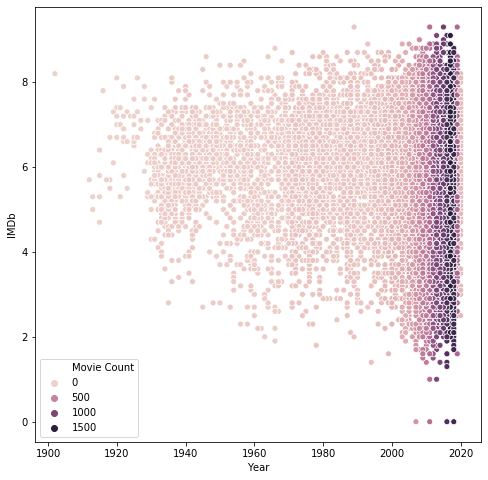

In [16]:
x = df["Year"]
y = df["IMDb"]

plt.figure(figsize=(8,8))
sns.scatterplot(x,y,data=df,hue="Movie Count")

There´s just no clear conclusion. We can see that the worst rated films were made around the years 2005 to 2018, but also the best rated ones. 

To clear this out, let´s plot a yearly averaged rating.

In [17]:
Rating = df_year["IMDb"]
Year = df_year.index

fig = px.line(df_year, x=Year, y=Rating, 
              line_shape="spline", render_mode="svg",
              hover_name=df.groupby("Year").mean().index,
              title="Average Movie Ratings 1902-2020")
fig.show()

Apparently it seems pretty obvious that the quality of film-making has gone downhill throughout the years.

However, this plot may be misleading due to the fact that there are some years that only contain one movie, whereas there are others with more than a thousand. To clear this up let´s draw a boxplot. 

In this boxplot, we will only see those years that contain more than one movie. 

In [18]:
fig = px.box(df, x="Year", y="IMDb",color="Year")
fig.show()

Now it´s much clearer. The average rating of films has remained pretty stable specially over the last years.

Finally, let´s analyze the relationship between Rating and Runtime and see if we can extract any conclusions.

In [19]:
fig = px.scatter(df,x="Runtime", y="IMDb",color="Year",
                 marginal_x="histogram",
                 marginal_y="histogram",
                 hover_name="Title",hover_data=["Age"])
fig.show()

## Age appropriateness

Are you old enough to watch that movie? Which type of public are most of the films aimed for?

Age
13+    1255
16+     320
18+    3474
7+     1462
all     843
Name: ID, dtype: int64


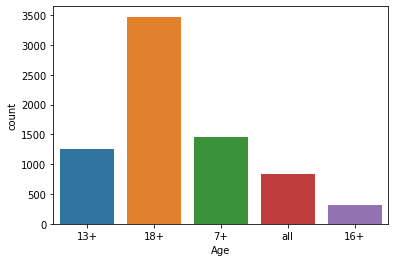

In [20]:
print(df.groupby("Age").count()["ID"])

sns.countplot(data=df,x="Age")

As we saw earlier, we are missing a lot of data on this subject, however, from what we have, we can clearly see that most movies are aimed for viewers over 18.

Nest, let´s see how the aimed public has changed over the years (if it has) and if there´s any relationship between movie lenght and age apropiateness

In [21]:
height = 800

fig2 = px.scatter(df.dropna(),x="Runtime", y="IMDb",color="Age",
                marginal_x="histogram",
                hover_name="Title",hover_data=["Year"],
                height=height)

fig1 = px.scatter(df.dropna(),x="Year", y="IMDb",color="Age",
                marginal_x="histogram",
                hover_name="Title",hover_data=["Runtime"],
                height=height)
fig1.show()
fig2.show()

## Runtime

Let´s start by simply showing the longest movies ever filmed.

In [22]:
data = df

n = 30

fig = px.bar(df.sort_values(by="Runtime",ascending=False).reset_index().iloc[:n],
             x = "Title", y='Runtime',
             color='Runtime',
             hover_data=["Directors","Year","IMDb"],
             title=f"Top {n} longest movies",
             height=800)
fig.show()

The runtime of the first two movies Colorado, 1940 and Law of the Lawless, seems to be inaccurate. Accorind to IMDb, teh first on has a length of 57 min whereas the second one lasts 87 min. 

This means that The Vatican Museums would become the longest movie in our data set with 410 minutes (almost 7 hours!).

It´s always good to contrast our data when we see something suspicious as a 1256 minute film.

The ammended graph would look something like this, by removing the first two movies.

In [23]:
fig = px.bar(df.sort_values(by="Runtime",ascending=False).reset_index().iloc[2:n],
             x = "Title", y='Runtime',
             color='Runtime',
             hover_data=["Directors","Year","IMDb"],
             title=f"Top {n} longest movies",
             height=800)
fig.show()

Here´s just a longer list of the top 100 movies with the highest runtime.

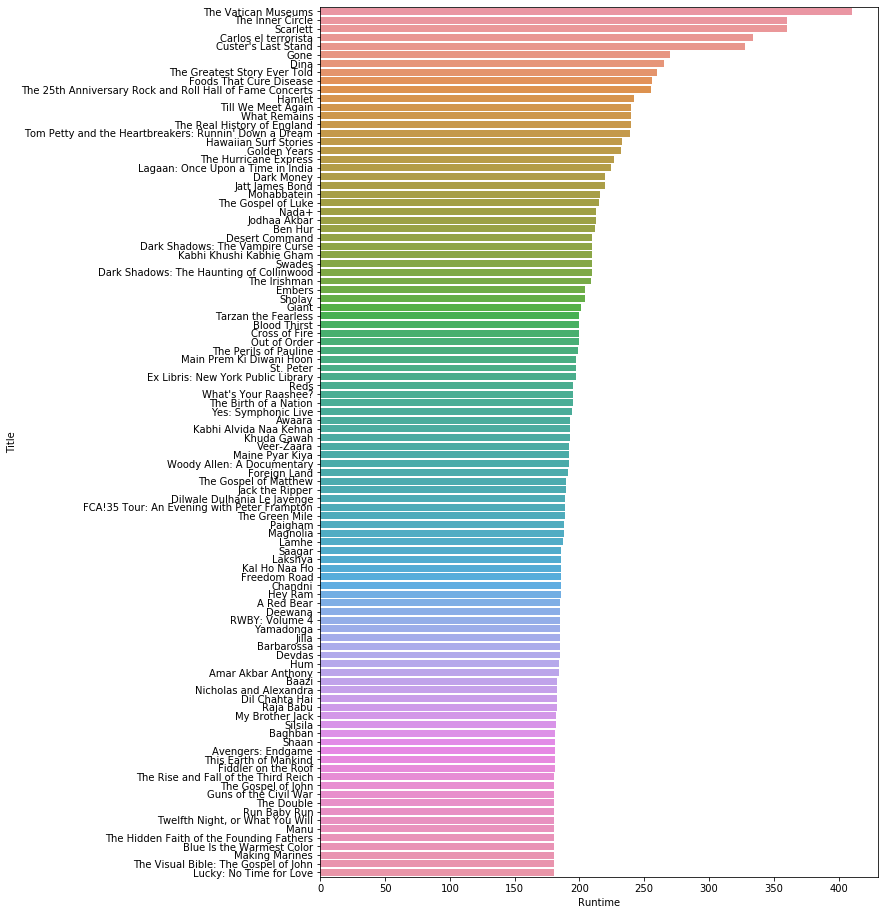

In [24]:
plt.figure(figsize=(10,16))
sns.barplot(x="Runtime",y="Title",data=df.sort_values(by="Runtime",ascending=False).reset_index().iloc[2:102])

But how has this feature variated troughout the years?

In [25]:
Runtime = df_year["Runtime"]
Year = df_year.index

#LIneplot

fig = px.line(df_year, x=Year, y=Runtime, 
              line_shape="spline", render_mode="svg",
              hover_name=df.groupby("Year").mean().index,
              title="Average Movie Runtimes 1902-2020")
fig.show()

print("\n")
print("As we did before, we will plot a boxplot to clear thigs up ever more")

# Boxplot

fig = px.box(df.sort_values(by="Runtime",ascending=False).iloc[2:], x="Year", y="Runtime",
             color="Year",height=1000,
             hover_data=["Title"])
fig.show()



As we did before, we will plot a boxplot to clear thigs up ever more


## Directed by...

In order to simplify things, we create a new dataframe with all the directors and the number of movies they´ve directed.

In [26]:
# Create a new dataframe specific for directors and the number of movies they directed

directors = pd.DataFrame(df.groupby(["Directors"]).count()["ID"])
directors["No. of Films"] = directors["ID"]
directors.drop(["ID"],axis=1,inplace=True)

Here are some plots showing this information. Top 100 directors with the most directed movies and top 40 where you can see the number of movies they´ve directed.

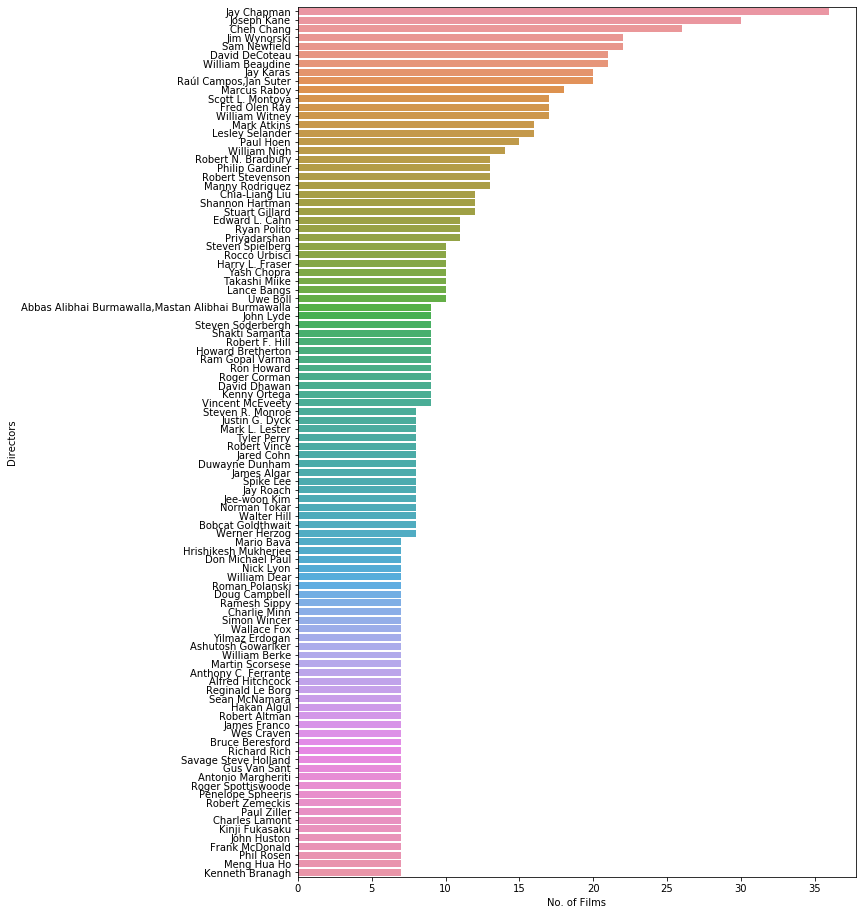

In [27]:
data = directors.sort_values(by="No. of Films",ascending=False).reset_index().iloc[:100]

plt.figure(figsize=(10,16))
sns.barplot(x="No. of Films",y="Directors",data=data)

In [28]:
n = 40
data = directors.sort_values(by="No. of Films",ascending=False).reset_index().iloc[:n]

fig = px.bar(data,
             x = "Directors", y='No. of Films',
             color='No. of Films',
             title=f"Top {n} directors with most directed movies")
fig.show()

In [29]:
# Create directors dict where key=name and value=number of directors

directors = {}

for i in df["Directors"].dropna():
    #print(i,len(i.split(",")))
    directors[i] = len(i.split(","))
    
# Add this information to our dataframe as a new column

df["Number of Directors"] = df['Directors'].map(directors)

# Sort by number of directors and show head

df.sort_values(by="Number of Directors",ascending=False).reset_index().head()

,index,Unnamed: 0,ID,Title,Year,Age,IMDb,Netflix,Hulu,Prime Video,Disney+,Type,Directors,Genres,Country,Language,Runtime,Movie Count,Number of Directors
0,11405,11405,11406,The Owner,2012,NaN,6.9,0,0,1,0,0,"Xavier Agudo,Ian Bonner,Michael Canzoniero,Fra...",Drama,"United States,Germany","English,German",94.0,843,28.0
1,12622,12622,12623,Fun Size Horror: Volume One,2015,NaN,4.6,0,0,1,0,0,"Bryan Chojnowski,Lisa J Dooley,Ned Ehrbar,Mali...",Horror,United States,English,86.0,1065,18.0
2,12206,12206,12207,A Taste of Phobia,2018,NaN,3.1,0,0,1,0,0,"Domiziano Cristopharo,Jason Impey,Sunny King,S...",Horror,United Kingdom,English,90.0,1285,17.0
3,8678,8678,8679,Happy Birthday,2016,18+,5.2,0,0,1,0,0,"Elizabeth Banks,Steven Brill,Steve Carr,Rusty ...",Comedy,United States,English,94.0,1206,13.0
4,4548,4548,4549,The Proposition,2005,18+,7.4,0,0,1,0,0,"Elizabeth Banks,Steven Brill,Steve Carr,Rusty ...",Comedy,United States,English,94.0,285,13.0


Now let´s plot this information.

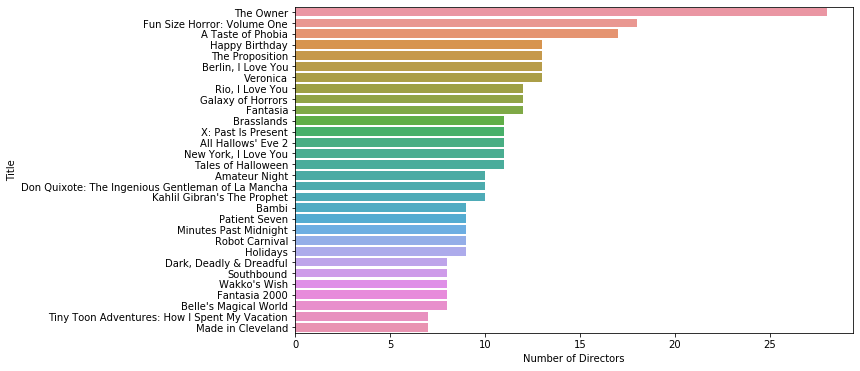

In [30]:
data = df.sort_values(by="Number of Directors",ascending=False).reset_index().iloc[:30]

plt.figure(figsize=(10,6))
sns.barplot(x="Number of Directors",y="Title",data=data)

According to our data, the film "The Owner" is the one directed by the most directors with a total of 28!

Now let´s find out who directed the best and worst rated movies.

In [31]:
# Directors who directed the best and worst IMDb ranked movies

n = 30
x="Directors"

data1 = df.groupby(by="Directors").mean().sort_values(by="IMDb",ascending=False).reset_index().iloc[:n]
data2 = df.groupby(by="Directors").mean().sort_values(by="IMDb",ascending=True).reset_index().iloc[2:n]

# For the worst IMDb average we droped the worst two because they had an average of 0 and it´s not considered representative

fig = px.bar(data1,x=data1["Directors"],y=data1["IMDb"],color="IMDb",
             title=f"Top {n} Directors with the highest averaged movie ratings")
fig.show()

fig = px.bar(data2,x=data2["Directors"],y=data2["IMDb"],color="IMDb",
            title=f"Top {n} Directors with the lowest averaged movie ratings")
fig.show()

Finally, we´ll do the same fot the longest and shortest movies

In [32]:
# Directors who directed the longest and shortest movies

n = 30
x="Directors"

data1 = df.groupby(by="Directors").mean().sort_values(by="Runtime",ascending=False).reset_index().iloc[:n]
data2 = df.groupby(by="Directors").mean().sort_values(by="Runtime",ascending=True).reset_index().iloc[:n]

# For the worst IMDb average we droped the worst two because they had an average of 0 and it´s not considered representative

fig = px.bar(data1,x=data1["Directors"],y=data1["Runtime"],color="Runtime",
             title=f"Top {n} Directors with longest average runtime for directed movies")
fig.show()

fig = px.bar(data2,x=data2["Directors"],y=data2["Runtime"],color="Runtime",
            title=f"Top {n} Directors with shortest average runtime for directed movies")
fig.show()

## Genres

First, let´s find out how many different genres we can find in our data set.

In [33]:
# How many different genres do we have?


print(f" We have {df['Genres'].nunique()} different genres")
print("\n")
print(df["Genres"].value_counts())

 We have 1909 different genres


Drama                                          1341
Documentary                                    1229
Comedy                                         1040
Comedy,Drama                                    446
Horror                                          436
                                               ... 
Adventure,Family,Music                            1
Action,Adventure,Comedy,Drama,Family              1
Adventure,Comedy,Drama,Family,Fantasy,Sport       1
Animation,Comedy,Family,Fantasy,Horror            1
Adventure,History,War,Western                     1
Name: Genres, Length: 1909, dtype: int64


In [34]:
# Some films cover various genres
# We can extract these genres by separating the words where the is a ","

all_genres = []

for genre in df["Genres"].dropna():
    movie_genres = genre.split(",")
    for i in movie_genres:
        all_genres.append(i)

In [35]:
d = Counter(all_genres)
print("These are the basic genres:")
d

These are the basic genres:


Counter({'Action': 2683,
         'Adventure': 1778,
         'Sci-Fi': 1228,
         'Thriller': 3354,
         'Comedy': 4637,
         'Western': 499,
         'Animation': 711,
         'Family': 1514,
         'Biography': 821,
         'Drama': 7227,
         'Music': 667,
         'War': 539,
         'Crime': 1833,
         'Fantasy': 1089,
         'Romance': 2359,
         'History': 715,
         'Mystery': 1274,
         'Horror': 2201,
         'Sport': 404,
         'Documentary': 2546,
         'Musical': 401,
         'News': 105,
         'Short': 386,
         'Reality-TV': 22,
         'Talk-Show': 19,
         'Game-Show': 7,
         'Film-Noir': 79})

In [36]:
# Let´s turn this into a dataframe so that we can plot it

genres = pd.DataFrame.from_dict(d, orient='index').reset_index()
genres["Genre"] = genres["index"]
genres["Count"] = genres[0]
genres.drop(["index",0],axis=1,inplace=True)
genres.head()

,Genre,Count
0,Action,2683
1,Adventure,1778
2,Sci-Fi,1228
3,Thriller,3354
4,Comedy,4637


In [37]:
genres.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27 entries, 0 to 26
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Genre   27 non-null     object
 1   Count   27 non-null     int64 
dtypes: int64(1), object(1)
memory usage: 560.0+ bytes


We can see that even though there are 1909 different genres including combined and individual, there are only 27 basic ones.

Let´s analyse which are the ones the audience love most.

In [38]:
# Genres

n = 30

# 1. Genre distribution as described in dataset. Including mixed genres.

data1 = df.groupby(by="Genres").count().sort_values(by="ID",ascending=False).reset_index().iloc[:n]

fig = px.pie(data1,names=data1["Genres"],values=data1["ID"],
            title=f'General Genre Distribution. Top {n} most common movie genres')
fig.show()

# 2. Genre individual distribution.
# If we split up the movies with a mixed Genre (i.e: Comedy,Drama,Romance)
# we get 27 basic genres.

fig = px.pie(genres, values='Count', names='Genre', 
             title='Movie Genres Proportion')
fig.show()

Let´s explain this a bit more...

The original "Genres" column in the dataset holds 1909 different genres. The reason as to why there are so many is because there are various combinations of different genres, such as Comedy/Drama, Documentary/Music or Horror/Mistery/Thriller. The first plot shows which of these combinations or individual genres are the most common. We can see that genres such as Drama or Documentary are very popular, as well as Comedy/Drama or Drama/Romance.

However, if we want to analyse which of the basic genres are the most popular, we must split up the composed genres into basic ones. Then we will find out how many basic genres we have, and how many times they appear. We arrive to the conclusion that there are 27 basic genres, being Drama, Comedy and Thriller the most popular ones. Information about these genres and their proportion is shown in the second plot   

Finally, we could see what the most common mixed genres are...

In [39]:
mixed_genres = []

for i in df["Genres"].dropna():
    if "," in i:
        mixed_genres.append(i)

d = Counter(mixed_genres)

print(f"We found a total of {len(d)} different genres")

# Create dataframe

df_mixedg = pd.DataFrame.from_dict(d, orient='index').reset_index()
df_mixedg["Genre"] = df_mixedg["index"]
df_mixedg["Count"] = df_mixedg[0]
df_mixedg.drop(["index",0],axis=1,inplace=True)
df_mixedg.head()

We found a total of 1883 different genres


,Genre,Count
0,"Action,Adventure,Sci-Fi,Thriller",35
1,"Action,Sci-Fi",46
2,"Action,Adventure,Sci-Fi",48
3,"Adventure,Comedy,Sci-Fi",6
4,"Animation,Action,Adventure,Family,Sci-Fi",5


In [40]:
n = 30

# 3. Most common mixed genres.

fig = px.pie(df_mixedg.sort_values(by="Count",ascending=False).reset_index().iloc[:n], values='Count', names='Genre', 
             title=f"Top {n} most common movie mixed genres")
fig.show()

To finish analysing genres, let´s see how they have varied throughout history.
Which have been the most popular genres of each year?

In [41]:
df_genre_year = pd.DataFrame(index=range(1902,2021),columns=Counter(all_genres).keys())
#df_genre_year.astype("float64")
df_genre_year.head()

,Action,Adventure,Sci-Fi,Thriller,Comedy,Western,Animation,Family,Biography,Drama,...,Horror,Sport,Documentary,Musical,News,Short,Reality-TV,Talk-Show,Game-Show,Film-Noir
1902,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1903,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1904,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1905,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1906,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [42]:
for year in range(1902,2021):
    genre_year = []
    for genres in df[df["Year"]==year]["Genres"].dropna():
        for i in genres.split(","):
            genre_year.append(i)

    d1 = Counter(genre_year)
    
    if len(d)==0:
        #df_genre_year.loc[year].fillna(0,inplace=True)
        pass
    
    df_genre_year.loc[year] = pd.Series(d1)

# Check some random years 
    
df_genre_year.loc[1928:1933]

C:\Users\Admin\anaconda3\lib\site-packages\ipykernel_launcher.py:13: DeprecationWarning:

The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.



,Action,Adventure,Sci-Fi,Thriller,Comedy,Western,Animation,Family,Biography,Drama,...,Horror,Sport,Documentary,Musical,News,Short,Reality-TV,Talk-Show,Game-Show,Film-Noir
1928,1,NaN,NaN,NaN,3,NaN,1,2,NaN,2,...,NaN,NaN,NaN,1,NaN,1,NaN,NaN,NaN,NaN
1929,1,1,NaN,2,2,NaN,NaN,1,NaN,4,...,NaN,NaN,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN
1930,2,1,NaN,1,8,1,NaN,1,2,4,...,NaN,NaN,NaN,1,NaN,1,NaN,NaN,NaN,NaN
1931,3,5,NaN,NaN,8,3,NaN,NaN,NaN,6,...,NaN,NaN,NaN,1,NaN,2,NaN,NaN,NaN,NaN
1932,7,6,1,6,10,3,1,2,NaN,11,...,3,1,NaN,1,NaN,2,NaN,NaN,NaN,NaN
1933,9,4,1,6,8,8,NaN,NaN,1,20,...,2,NaN,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN


In [43]:
# Fill all the missing values with 0

df_genre_year.fillna(0,inplace=True)
df_genre_year.loc[1928:1933]

,Action,Adventure,Sci-Fi,Thriller,Comedy,Western,Animation,Family,Biography,Drama,...,Horror,Sport,Documentary,Musical,News,Short,Reality-TV,Talk-Show,Game-Show,Film-Noir
1928,1.0,0.0,0.0,0.0,3.0,0.0,1.0,2.0,0.0,2.0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
1929,1.0,1.0,0.0,2.0,2.0,0.0,0.0,1.0,0.0,4.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1930,2.0,1.0,0.0,1.0,8.0,1.0,0.0,1.0,2.0,4.0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
1931,3.0,5.0,0.0,0.0,8.0,3.0,0.0,0.0,0.0,6.0,...,0.0,0.0,0.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0
1932,7.0,6.0,1.0,6.0,10.0,3.0,1.0,2.0,0.0,11.0,...,3.0,1.0,0.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0
1933,9.0,4.0,1.0,6.0,8.0,8.0,0.0,0.0,1.0,20.0,...,2.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [44]:
px.line(df_genre_year,height=800)

To end the notebook, let´s create a visual plot that shows us what words are most commonly used when picking the title for a movie.

Top 100 most common words used in the movie titles 1902-2020:


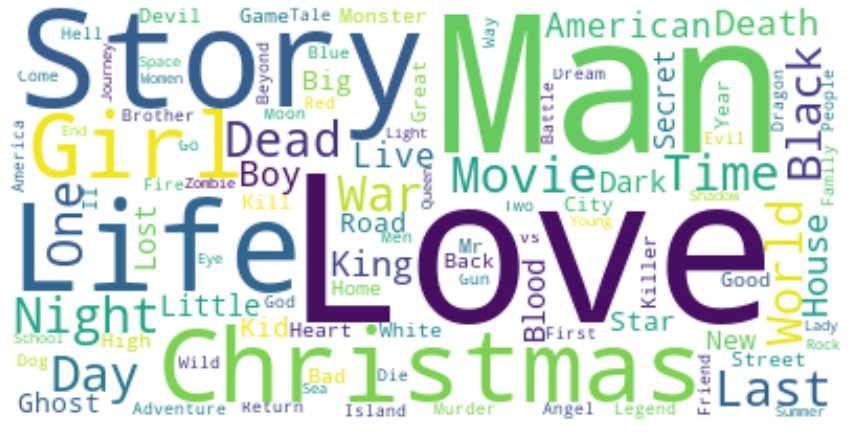

In [45]:
n = 100

text = ",".join(word for word in df["Title"])
wordcloud = WordCloud(max_words=n,collocations=False,background_color="white").generate(text)
plt.figure(figsize=(15,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.figure(1,figsize=(12, 12))

print(f"Top {n} most common words used in the movie titles 1902-2020:")
plt.show()

Top 100 most common words used in the movie titles in 1950:


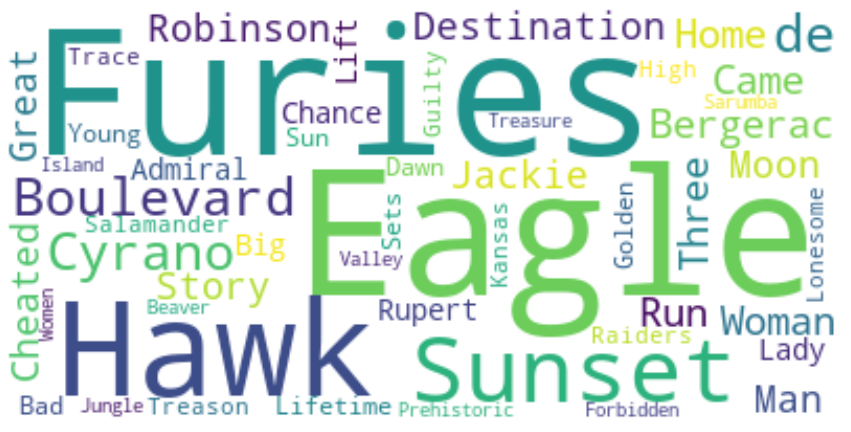



Top 100 most common words used in the movie titles in 2019:


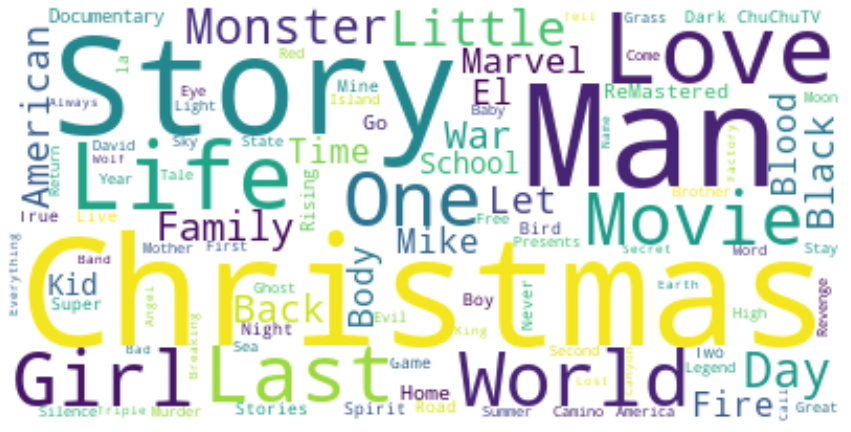

In [46]:
year1 = 1950
year2 = 2019
n = 100

text = ",".join(word for word in df[df["Year"]==year1]["Title"])
wordcloud = WordCloud(max_words=n,collocations=False,background_color="white").generate(text)
plt.figure(figsize=(15,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.figure(1,figsize=(12, 12))

print(f"Top {n} most common words used in the movie titles in {year1}:")
plt.show()

text = ",".join(word for word in df[df["Year"]==year2]["Title"])
wordcloud = WordCloud(max_words=n,collocations=False,background_color="white").generate(text)
plt.figure(figsize=(15,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.figure(1,figsize=(12, 12))

print("\n")
print(f"Top {n} most common words used in the movie titles in {year2}:")
plt.show()

The results are quite interesting. It shows that nowadays themes like love, christmas and life are the most popular, whereas 70 years ago, in 1950, films related to the words eagle, hawk, or sunset where the most common. We can certainly see the Western genre influence at that time.